In [1]:
import torch
import random
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import torch.nn as nn
import torch.nn.functional as F
import torch.optim

import math
import time
import os
import random

# Make the VF Solution and use it as input to network

import sys
sys.path.insert(0,'..')
import VF.vectorfit

/scratch/cluster/bodeng/miniconda3/envs/dip/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device('cuda:7' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:7


# 1. Load the data and get measurements

In [3]:
ROOT_PATH = "/scratch/cluster/bodeng/UTAFSDataNew/new_data"
CHIP_NUM = 23

In [4]:
import utils

data_dict = utils.grab_chip_data(ROOT_PATH, CHIP_NUM)

In [5]:
data_dict.keys()

dict_keys(['gt_matrix', 'gt_freqs', 'vf_matrix', 'y_matrix', 'y_freqs'])

## Convert the raw data matrices to only the unique S-parameters

In [6]:
vf_data = utils.matrix_to_sparams(data_dict['vf_matrix'])
gt_data = utils.matrix_to_sparams(data_dict['gt_matrix'])
y_data = utils.matrix_to_sparams(data_dict['y_matrix'])

print("VF S-parameters shape: ", vf_data.shape)
print("GT S-parameters shape: ", gt_data.shape)
print("Y S-parameters shape: ", y_data.shape)

VF S-parameters shape:  (3, 2, 2081)
GT S-parameters shape:  (3, 2, 2081)
Y S-parameters shape:  (3, 2, 155)


In [7]:
gt_freqs = data_dict['gt_freqs']
y_freqs = data_dict['y_freqs']

print("GT frequencies shape: ", gt_freqs.shape)
print("Y frequencies shape: ", y_freqs.shape)

GT frequencies shape:  (2081,)
Y frequencies shape:  (155,)


In [8]:
import scipy as sp

spacings = gt_freqs[1:] - gt_freqs[:-1]

mode_spacing = sp.stats.mode(spacings, keepdims=False)[0]
num_mode = len(np.where(spacings==mode_spacing)[0])

print("First frequency point: ", gt_freqs[0])
print("Mean frequency spacing: ", np.mean(spacings))
print("STD frequency spacing: ", np.std(spacings))
print("Mode frequency spacing: ", mode_spacing)
print("Number of samples with non-equal spacing: ", len(gt_freqs) - num_mode)

First frequency point:  40000000.0
Mean frequency spacing:  19211538.46153846
STD frequency spacing:  6057692.307692306
Mode frequency spacing:  18000000.0
Number of samples with non-equal spacing:  81


In [9]:
#NOTE THIS IS EXPERIMENTAL!!!
if gt_freqs[0] == 0:
    gt_freqs = gt_freqs[1:]
    gt_data = gt_data[:, :, 1:]

## Make some variables we will need

In [10]:
N_FREQS = gt_data.shape[-1]
N_SPARAMS = gt_data.shape[0]  

print("N_FREQS: ", N_FREQS)
print("N_SPARAMS: ", N_SPARAMS)

N_FREQS:  2081
N_SPARAMS:  3


In [11]:
x = torch.from_numpy(gt_data).view(-1, N_FREQS).unsqueeze(0).to(device)

print("x shape: ", x.shape)

x shape:  torch.Size([1, 6, 2081])


In [12]:
x_mag = utils.sparams_to_mag(x)

print("x_mag shape: ", x_mag.shape)

x_mag shape:  torch.Size([1, 3, 2081])


## Plot some stuff

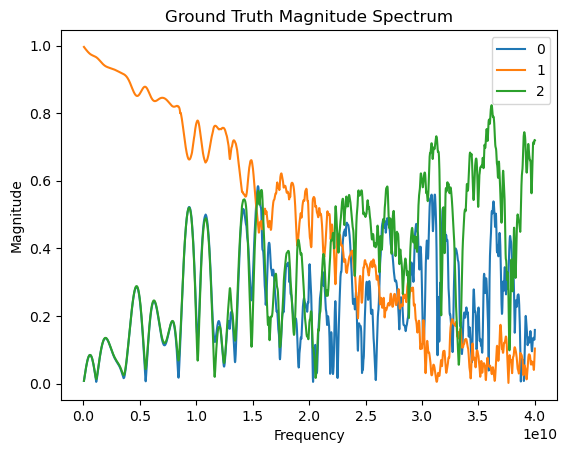

In [13]:
plt.figure()
for i in range(N_SPARAMS):
    plt.plot(gt_freqs, x_mag[0, i].cpu(), label=str(i))
if N_SPARAMS <= 10:
    plt.legend()
plt.title("Ground Truth Magnitude Spectrum")
plt.ylabel("Magnitude")
plt.xlabel("Frequency")
plt.show()

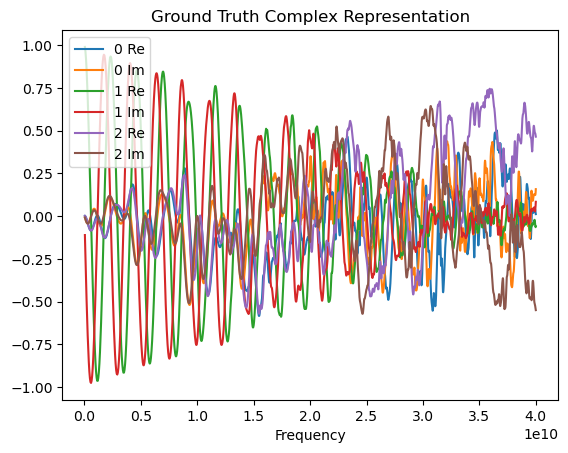

In [14]:
plt.figure()
for i in range(N_SPARAMS):
    plt.plot(gt_freqs, x[0,2*i].cpu(), label=str(i)+" Re")
    plt.plot(gt_freqs, x[0,2*i+1].cpu(), label=str(i)+" Im")
if N_SPARAMS <= 10:
    plt.legend()
plt.title("Ground Truth Complex Representation")
plt.xlabel("Frequency")
plt.show()

## Grab Some Measurements

In [15]:
PROBLEM_TYPE = "equal" #[random, equal, forecast, full, log, sqrt]
# M = int(0.10 * N_FREQS)
M = 155

kept_inds, missing_inds = utils.get_inds(PROBLEM_TYPE, N_FREQS, M)
old_kept = kept_inds.copy()

M = len(kept_inds) #re-define in case kept_inds is off by 1 or something

# remove every other point, starting at the back, don't remove first point
remove = False
for i in range(len(kept_inds) - 1, 0, -1):
    if remove:
        kept_inds = np.delete(kept_inds, [i])
        remove = False
    else:
        remove = True

print("Number of Ground Truth Frequency Points: ", N_FREQS)
print("Number of Measurements: ", M)
print("Undersampling Ratio: ", M/N_FREQS)
print(kept_inds)
print(old_kept)

Number of Ground Truth Frequency Points:  2081
Number of Measurements:  155
Undersampling Ratio:  0.07448342143200384
[   0   27   54   81  108  135  162  189  216  243  270  297  324  351
  378  405  432  459  486  513  540  567  594  621  648  675  702  729
  756  783  810  837  864  891  918  945  972  999 1026 1053 1080 1107
 1134 1161 1188 1215 1242 1269 1296 1323 1350 1377 1404 1431 1458 1485
 1512 1539 1566 1593 1620 1647 1674 1701 1728 1755 1782 1809 1836 1863
 1890 1917 1944 1971 1998 2025 2052 2080]
[   0   13   27   40   54   67   81   94  108  121  135  148  162  175
  189  202  216  229  243  256  270  283  297  310  324  337  351  364
  378  391  405  418  432  445  459  472  486  499  513  526  540  553
  567  580  594  607  621  634  648  661  675  688  702  715  729  742
  756  769  783  796  810  823  837  850  864  877  891  904  918  931
  945  958  972  985  999 1012 1026 1040 1053 1067 1080 1094 1107 1121
 1134 1148 1161 1175 1188 1202 1215 1229 1242 1256 1269 128

In [16]:
y = torch.clone(x)[:, :, kept_inds]
y_freqs = gt_freqs[kept_inds]

print("y shape: ", y.shape)
print("y_freqs shape: ", y_freqs.shape)

y shape:  torch.Size([1, 6, 78])
y_freqs shape:  (78,)


# 2. Network Setup

## Define network parameters

In [17]:
NZ = y.shape[1]

NUM_LAYERS = int(np.ceil(np.log2(N_FREQS))) - 4

if NZ < 64:
    BASE_NGF = 2 ** (int(np.ceil(np.log2(NZ))) + 1) #second power of two after NZ 
elif NZ < 128:
    BASE_NGF = 2 ** int(np.ceil(np.log2(NZ))) #next highest power of 2
else:
    BASE_NGF = NZ

NGF = [BASE_NGF] * NUM_LAYERS

BS = y.shape[0]
NC = y.shape[1]

KERNEL_SIZE = 3
USE_SKIP = False
CAUSAL_PASSIVE = True
OPTIMIZE_Z = False
USE_SGLD = False

In [18]:
print("NZ: ", str(NZ))
print("NUM_LAYERS: ", str(NUM_LAYERS))
print("BASE NGF: ", str(BASE_NGF))
print("NGF: ", str(NGF))
print("BS: ", BS)
print("NC: ", NC)
print("KERNEL_SIZE: ", KERNEL_SIZE)
print("USE_SKIP: ", USE_SKIP)
print("CAUSAL_PASSIVE: ", CAUSAL_PASSIVE)
print("OPTIMIZE_Z: ", OPTIMIZE_Z)

NZ:  6
NUM_LAYERS:  8
BASE NGF:  16
NGF:  [16, 16, 16, 16, 16, 16, 16, 16]
BS:  1
NC:  6
KERNEL_SIZE:  3
USE_SKIP:  False
CAUSAL_PASSIVE:  True
OPTIMIZE_Z:  False


## Init and check dimensions

In [19]:
from models import RES_UNET

net = RES_UNET(bs=BS,
               nz=NZ,
               ngf=NGF,
               output_size=N_FREQS,
               nc=NC,
               optimize_z=OPTIMIZE_Z,
               kernel_size=KERNEL_SIZE,
               num_layers=NUM_LAYERS,
               use_skip=USE_SKIP,
               causal_passive=CAUSAL_PASSIVE,
               p_dropout=0.0
               )
net = net.to(device)

In [20]:
test_out = net.forward_with_z()

print("Net output shape: ", test_out.shape)

Net output shape:  torch.Size([1, 6, 2081])


/scratch/cluster/bodeng/miniconda3/envs/dip/lib/python3.9/site-packages/torch/nn/functional.py:1338: UserWarning: dropout2d: Received a 3D input to dropout2d and assuming that channel-wise 1D dropout behavior is desired - input is interpreted as shape (N, C, L), where C is the channel dim. This behavior will change in a future release to interpret the input as one without a batch dimension, i.e. shape (C, H, W). To maintain the 1D channel-wise dropout behavior, please switch to using dropout1d instead.
  warnings.warn("dropout2d: Received a 3D input to dropout2d and assuming that channel-wise "


In [21]:
pytorch_total_params = sum(p.numel() for p in net.parameters() if p.requires_grad)

print("TOTAL PARAMS: ", pytorch_total_params)

TOTAL PARAMS:  30098


# 3. Run

## Define training parameters, losses, and track stats

In [22]:
#grab the correct file we want for VF
NUM_ACTIVE = M - len(kept_inds)

LR = 2e-4
FIRST_ITER = 20000
NUM_ITER = 2000
CURR_ITER = FIRST_ITER
TOTAL_ITERS = FIRST_ITER + NUM_ITER * NUM_ACTIVE
NUM_BURN_ITER = NUM_ITER * 0 # 0.2
SAMPLE_EVERY = 40

ACTIVE_ITER_RATIO = 0.1
SAMPLE_LAST_N = NUM_ITER * ACTIVE_ITER_RATIO

# TODO: maybe come back to this?
# TOTAL_ITER = NUM_ITER + 0.1 * NUM_ACTIVE * NUM_ITER

REG_HYPERPARAM = 1.0
NOISY_INPUT = True
USE_SGLD = False

if REG_HYPERPARAM > 0:
    regularizer = utils.Smoothing_Loss(per_param=False, reduction="sum")
    regularizer = regularizer.to(device)

optim = torch.optim.Adam(net.parameters(), lr=LR)

def get_lr(optim):
    for g in optim.param_groups:
        return g['lr']
    
def set_lr(optim, lr):
    for g in optim.param_groups:
        g['lr'] = lr
        
START_NOISE_LEVEL = CUR_NOISE_LEVEL = 1.0
END_NOISE_LEVEL = 0.001
NOISE_DECAY_FACTOR = (END_NOISE_LEVEL / START_NOISE_LEVEL)**(1 / TOTAL_ITERS) 

train_losses = []
train_errors = []
if REG_HYPERPARAM > 0:
    train_regs = []

test_mses = []
test_maes = []

is_initial_fit = True
tic = time.time()
net.train()

# (NUM_ACTIVE + 1) * NUM_OUTPUTS * S_PARAMS * FREQS
sgld_outputs_by_sample = []
# (NUM_ACTIVE + 1) * S_PARAMS * FREQS
sgld_means_by_sample = []
# (NUM_ACTIVE + 1) * S_PARAMS * FREQS
sgld_stds_by_sample = []

print("NUM ACTIVE: ", NUM_ACTIVE)

for num_actively_sampled in range(NUM_ACTIVE + 1):

    cur_sgld_outputs = torch.Tensor().to(device)   

    if not is_initial_fit:

        LENGTH_GT = len(gt_freqs)
        cn = str(CHIP_NUM) if CHIP_NUM > 9 else "0" + str(CHIP_NUM)
        fname = os.path.join(ROOT_PATH, "case"+cn)

        children = os.listdir(fname)
        children = [f for f in children if cn + ".s" in f]

        final_path = os.path.join(fname, children[0])

        fitter = VF.vectorfit.VectorFitter(final_path)
        fit1 = fitter.vector_fit("VF Result", y_freqs) 
        vf_output = fit1.fitted_network.s

        vf_data = np.stack((vf_output.real, vf_output.imag), axis=-1)
        vf_data = utils.matrix_to_sparams(vf_data)
        vf_data = torch.tensor(vf_data).view(1, -1, LENGTH_GT)
        vf_data = vf_data.to(device)

        
        # Find the maximum standard deviation point, and use it to update kept_inds
        print(sgld_outputs_by_sample)
        max_disagree_idx = find_max_variance(sgld_outputs_by_sample[-1][-1], vf_data, pickRandom=False)
        kept_inds = np.sort(np.append(kept_inds, max_disagree_idx))
        print(kept_inds)

        # Recreate the y data with the new kept_inds
        y = torch.clone(x)[:, :, kept_inds]
        y_freqs = gt_freqs[kept_inds]


    # Update the criterion to reflect the new point we have sampled
    criterion = utils.Measurement_MSE_Loss(kept_inds=kept_inds, per_param=False, reduction="sum")
    criterion = criterion.to(device)


    for i in range(int(CURR_ITER)):
        optim.zero_grad()
        
        if NOISY_INPUT:
            out = net.forward_with_z(CUR_NOISE_LEVEL)
            CUR_NOISE_LEVEL *= NOISE_DECAY_FACTOR
        else:
            out = net.forward_with_z()
        
        train_error = criterion(out, y) 
        if REG_HYPERPARAM > 0:
            train_reg = REG_HYPERPARAM * regularizer(out)
            train_loss = train_error + train_reg
        else:
            train_loss = train_error
        
        train_loss.backward()
        optim.step()

        with torch.no_grad():
            # First 20% of training will be burn-in iterations
            if (not is_initial_fit or i > NUM_BURN_ITER) and USE_SGLD:
                # Perform SGLD by adding Gaussian noise to parameters after gradient descent
                for param in net.parameters():
                    # param.add_(torch.normal(0, get_lr(optim), size=param.size()).to(device))
                    param.add_(torch.randn_like(param) * get_lr(optim) * 2)
            
            # Log the standard metrics across different numbers of samples given
            train_losses.append(train_loss.item())
            train_errors.append(train_error.item())
            if REG_HYPERPARAM > 0:
                train_regs.append(train_reg.item())
            
            test_mse = nn.MSELoss()(out, x)
            test_mses.append(test_mse.item())
            
            test_mae = nn.L1Loss()(out, x)
            test_maes.append(test_mae.item())

            if (i+1)%1000 == 0 or i == 0:
                toc = time.time()
                print("ITER ", str(i))
                print("TIME: ", str(toc - tic))
                if NOISY_INPUT:
                    print("NOISE LEVEL: ", CUR_NOISE_LEVEL)
                print()

            # Get SGLD outputs for finding mean/std
            if (NUM_ITER - i <= SAMPLE_LAST_N) and i % SAMPLE_EVERY == 0:
                cur_sgld_outputs = torch.cat([cur_sgld_outputs, out])

    sgld_outputs_by_sample.append(cur_sgld_outputs)
    sgld_means_by_sample.append(torch.mean(cur_sgld_outputs, dim=0))
    sgld_stds_by_sample.append(torch.std(cur_sgld_outputs, dim=0))

    if is_initial_fit :
    #     NUM_ITER *= ACTIVE_ITER_RATIO
        CURR_ITER = NUM_ITER
        is_initial_fit = False


    def find_max_variance(outputs, vf_outputs, pickRandom=False):
        # Outputs of shape [NUM_OUTPUTS, 20, 1000]

        # Call np.var with dim = 0 to get shape [20, 1000]
        print(vf_outputs.shape)
        print(outputs.shape)
        sqr_differences = torch.square(torch.subtract(vf_outputs[0], outputs))

        # Sum to go to [1000]
        sqr_differences = torch.mean(sqr_differences, dim=0)

        if pickRandom:
            while True:
                rand_idx = random.randint(0, len(sqr_differences) - 1)
                if rand_idx not in kept_inds:
                    print("picked: ", rand_idx)
                    return rand_idx

        _, idxs = torch.topk(sqr_differences, len(sqr_differences))

        for idx in idxs:
            if idx.item() not in kept_inds:
                return idx.item()
        return -1
    
    print("NUM_SAMPLES ", str(num_actively_sampled))
    print("TIME: ", str(toc - tic))


NUM ACTIVE:  77
ITER  0
TIME:  1.6312789916992188
NOISE LEVEL:  0.9999603010450417

ITER  999
TIME:  32.1785614490509
NOISE LEVEL:  0.9610779662376226

ITER  1999
TIME:  62.02305865287781
NOISE LEVEL:  0.9236708571874458

ITER  2999
TIME:  92.18269634246826
NOISE LEVEL:  0.8877197088986725

ITER  3999
TIME:  121.90541791915894
NOISE LEVEL:  0.8531678524173888

ITER  4999
TIME:  151.53914165496826
NOISE LEVEL:  0.8199608244606221

ITER  5999
TIME:  179.85448455810547
NOISE LEVEL:  0.788046281567139

ITER  6999
TIME:  209.35102128982544
NOISE LEVEL:  0.7573739175896664

ITER  7999
TIME:  238.82322716712952
NOISE LEVEL:  0.7278953843984988

ITER  8999
TIME:  268.5271005630493
NOISE LEVEL:  0.6995642156714612

ITER  9999
TIME:  297.7259683609009
NOISE LEVEL:  0.6723357536501458

ITER  10999
TIME:  327.08138251304626
NOISE LEVEL:  0.6461670787469219

ITER  11999
TIME:  356.580974817276
NOISE LEVEL:  0.6210169418917959

ITER  12999
TIME:  386.3875823020935
NOISE LEVEL:  0.5968456995124765

I

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. 
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: UserWarning: The fitted network is passive, but the vector fit is not passive. Consider running `passivity_enforce()` to enforce passivity before using this model.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.07814047485589981 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 0.9945360371373274 vs 1.2510016609104997)
Performing fit with 3 poles.
  Fitting took 0.09067962691187859 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2451801956036024 vs 0.9945360371373274)
Performing fit with 4 poles.
  Fitting took 0.11526655033230782 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.4452980082750837 vs 0.9945360371373274)
Performing fit with 5 poles.
  Fitting took 0.14559464529156685 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 3 (err 1.7508264253786945 vs 0.9945360371373274)
Fit completed in 0.7418327331542969, using 5, resulting in a fit wit

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. 
  vf.vector_fit(n_poles_cmplx=n_poles)


ITER  0
TIME:  709.9256680011749
NOISE LEVEL:  0.3856467317366019

ITER  999
TIME:  739.2744710445404
NOISE LEVEL:  0.37065129109250966

ITER  1999
TIME:  768.781656742096
NOISE LEVEL:  0.3562247890265388

NUM_SAMPLES  3
TIME:  768.781656742096
Performing fit with 1 poles.
  Fitting took 0.05522314831614494 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
Performing fit with 2 poles.
  Fitting took 0.07145978696644306 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.418477807183982 vs 1.177596344983463)
Performing fit with 3 poles.
  Fitting took 0.09437049739062786 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 2 (err 1.4460431515831638 vs 1.177596344983463)
Performing fit with 4 poles.
  Fitting took 0.0748873483389616 seconds.
  Filling sampled network.
  Filling full sweep n

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 12903482949.933025). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11597011052072048 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.6099203639878163 vs 1.5399544988825526)
Performing fit with 5 poles.
  Fitting took 0.3117879554629326 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.3395802510897978 vs 1.5399544988825526)
Performing fit with 6 poles.
  Fitting took 0.1584540717303753 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.0653366598184808 vs 1.3395802510897978)
Performing fit with 7 poles.
  Fitting took 0.23426564410328865 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 7 (err 0.6475444048616575 vs 1.0653366598184808)
Performing fit with 8 poles.
  Fitting took 0.19184727407991886 seconds.
  Filling sampled network.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 23089118573.359306). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12197782099246979 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.6102650404887975 vs 1.5396226447833106)
Performing fit with 5 poles.
  Fitting took 1.0357179567217827 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.8192576836602685 vs 1.5396226447833106)
Performing fit with 6 poles.
  Fitting took 0.16072882898151875 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 1.0670581411449656 vs 1.5396226447833106)
Performing fit with 7 poles.
  Fitting took 0.2599882557988167 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.134242158164739 vs 1.0670581411449656)
Performing fit with 8 poles.
  Fitting took 0.21060740016400814 seconds

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 408698062689.61707). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11386225558817387 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.609388134819765 vs 1.540611273470385)
Performing fit with 5 poles.
  Fitting took 0.18288970924913883 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.3422645840405327 vs 1.540611273470385)
Performing fit with 6 poles.
  Fitting took 0.1573578231036663 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.0705639500258173 vs 1.3422645840405327)
Performing fit with 7 poles.
  Fitting took 0.26434069871902466 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 7 (err 0.648708306552139 vs 1.0705639500258173)
Performing fit with 8 poles.
  Fitting took 0.23841893672943115 seconds.
  Filling sampled network.
  F

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 12399616046.360607). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.10212493129074574 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.60389330373001 vs 1.532342140452275)
Performing fit with 5 poles.
  Fitting took 1.4449259079992771 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.3333057381380224 vs 1.532342140452275)
Performing fit with 6 poles.
  Fitting took 0.15516570210456848 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.0676962556528047 vs 1.3333057381380224)
Performing fit with 7 poles.
  Fitting took 0.3342035096138716 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.1223962814000517 vs 1.0676962556528047)
Performing fit with 8 poles.
  Fitting took 0.18613543920218945 seconds.
  Filling sample

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 38512312910.92456). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11646926961839199 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 2 (err 1.6030305142795374 vs 1.5528579137853549)
Fit completed in 0.5080142021179199, using 4, resulting in a fit with 2 and error=1.5528579137853549 vs samples and error=1.5621896549286856 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.2029e-03, -1.0938e-03,  ..., -6.1218e-03,
          -2.9592e-03, -3.9454e-03],
         [-4.3485e-02, -4.7898e-02, -5.2749e-02,  ..., -9.3349e-02,
          -9.2320e-02, -9.1464e-02],
         [-4.9368e-03, -1.0380e-02, -1.4301e-02,  ..., -2.2759e-02,
          -2.3088e-02, -2.6781e-02],
         [ 2.3375e-02,  2.4992e-02,  2.9221e-02,  ...,  3.1970e-02,
           2.7274e-02,  1.7844e-02],
         [ 5.5520e-04,  3.4126e-03,  1.4048e-03,  ..., -8.4120e-03,
          -1.8447e-02, -1.6203e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 15725932456.068016). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.16802471689879894 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 4 (err 1.7694923856569351 vs 1.5397835510105622)
Performing fit with 6 poles.
  Fitting took 0.19265663623809814 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.6198136382261648 vs 1.5397835510105622)
Performing fit with 7 poles.
  Fitting took 0.22718000411987305 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 0.6548179180352494 vs 0.6198136382261648)
Performing fit with 8 poles.
  Fitting took 0.18313128873705864 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 0.6785082802836172 vs 0.6198136382261648)
Performing fit with 9 poles.
  Fitting took 0.2414877526462078 secon

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 179236843967.1702). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.08622441999614239 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.5446280506133192 vs 1.5581356384129648)
Performing fit with 4 poles.
  Fitting took 0.06186004355549812 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.6849190603664406 vs 1.5446280506133192)
Performing fit with 5 poles.
  Fitting took 0.2804160453379154 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 4 (err 1.7864969376000839 vs 1.5446280506133192)
Performing fit with 6 poles.
  Fitting took 0.17347658425569534 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.6356201905651541 vs 1.5446280506133192)
Performing fit with 7 poles.
  Fitting took 0.33611829206347466 seconds.
  Filling s

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 49725648040.833565). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.09651682339608669 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.5470500458282506 vs 1.5523901701640528)
Performing fit with 4 poles.
  Fitting took 0.08890138193964958 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.6801773329252818 vs 1.5470500458282506)
Performing fit with 5 poles.
  Fitting took 0.5122395232319832 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 4 (err 1.8095591021653596 vs 1.5470500458282506)
Performing fit with 6 poles.
  Fitting took 0.3152939975261688 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 1.06657962552576 vs 1.5470500458282506)
Performing fit with 7 poles.
  Fitting took 0.5078918151557446 seconds.
  Filling sampl

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 69734088784.00894). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.25086696818470955 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 4 (err 1.8134466235299096 vs 1.5458128639775783)
Performing fit with 6 poles.
  Fitting took 0.1440731044858694 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.6243144344268063 vs 1.5458128639775783)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 98611269366.01488). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3434623498469591 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.4721790750884451 vs 0.6243144344268063)
Performing fit with 8 poles.
  Fitting took 0.23081317730247974 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 0.6461106023781453 vs 0.6243144344268063)
Performing fit with 9 poles.
  Fitting took 0.48137400671839714 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 0.7225083638532094 vs 0.6243144344268063)
Fit completed in 2.022451162338257, using 9, resulting in a fit with 7 and error=0.6243144344268063 vs samples and error=0.6311335903047454 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.2029e-03

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 24407995252.69628). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4108945932239294 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.473894622931295 vs 1.0682636502670153)
Performing fit with 8 poles.
  Fitting took 0.24391904287040234 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6461235312597879 vs 1.0682636502670153)
Performing fit with 9 poles.
  Fitting took 0.36421881057322025 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.722540606381046 vs 0.6461235312597879)
Performing fit with 10 poles.
  Fitting took 0.3802911061793566 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0425614888985388 vs 0.6461235312597879)
Performing fit with 11 poles.
  Fitting took 0.38641759753227234 seco

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 12195745241.679308). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.09120005555450916 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 2 (err 1.4961214026521321 vs 2.025289454950644)
Performing fit with 4 poles.
  Fitting took 0.09413066320121288 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.7043516914723325 vs 1.4961214026521321)
Performing fit with 5 poles.
  Fitting took 0.13762972876429558 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.3463750958341631 vs 1.4961214026521321)
Performing fit with 6 poles.
  Fitting took 0.32683873549103737 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3688734713281256 vs 1.3463750958341631)
Performing fit with 7 poles.
  Fitting took 0.3495959881693125 seconds.
  Filling sa

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 16508246261.754667). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3320109322667122 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 6 (err 1.4463372092201319 vs 1.3463750958341631)
Fit completed in 1.783400297164917, using 8, resulting in a fit with 6 and error=1.3463750958341631 vs samples and error=1.3881130484339985 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.2029e-03, -1.0938e-03,  ..., -6.1218e-03,
          -2.9592e-03, -3.9454e-03],
         [-4.3485e-02, -4.7898e-02, -5.2749e-02,  ..., -9.3349e-02,
          -9.2320e-02, -9.1464e-02],
         [-4.9368e-03, -1.0380e-02, -1.4301e-02,  ..., -2.2759e-02,
          -2.3088e-02, -2.6781e-02],
         [ 2.3375e-02,  2.4992e-02,  2.9221e-02,  ...,  3.1970e-02,
           2.7274e-02,  1.7844e-02],
         [ 5.5520e-04,  3.4126e-03,  1.4048e-03,  ..., -8.4120e-03,
          -1.8447e-02, -1.6203e-02

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 78224611402.87251). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2979575004428625 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.4490760214415193 vs 1.1076047368601982)
Performing fit with 8 poles.
  Fitting took 0.34654671512544155 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 6 (err 1.41730058676944 vs 1.1076047368601982)
Fit completed in 1.9048409461975098, using 8, resulting in a fit with 6 and error=1.1076047368601982 vs samples and error=1.2079860979535284 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.2029e-03, -1.0938e-03,  ..., -6.1218e-03,
          -2.9592e-03, -3.9454e-03],
         [-4.3485e-02, -4.7898e-02, -5.2749e-02,  ..., -9.3349e-02,
          -9.2320e-02, -9.1464e-02],
         [-4.9368e-03, -1.0380e-02, -1.4301e-02,  ..., -2.2759e-02,
 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 16550662965.130323). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.34202365204691887 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.5084685687760884 vs 0.6243705839758227)
Performing fit with 8 poles.
  Fitting took 0.21411887183785439 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 0.66134286007538 vs 0.6243705839758227)
Performing fit with 9 poles.
  Fitting took 0.270730996504426 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 0.8675092366778089 vs 0.6243705839758227)
Fit completed in 1.8461012840270996, using 9, resulting in a fit with 7 and error=0.6243705839758227 vs samples and error=0.6409303148382831 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.2029e-03, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 1596456419301.3464). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6586057469248772 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.503738536031582 vs 1.3159106776248275)
Performing fit with 8 poles.
  Fitting took 0.24515934474766254 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6606777463628222 vs 1.3159106776248275)
Performing fit with 9 poles.
  Fitting took 0.2593017052859068 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.9413032339300331 vs 0.6606777463628222)
Performing fit with 10 poles.
  Fitting took 0.37914796359837055 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0842042014589506 vs 0.6606777463628222)
Performing fit with 11 poles.
  Fitting took 0.537922453135252 secon

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 77452652682.02031). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1468968652188778 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.3159863749457807 vs 1.4823744331216484)
Performing fit with 6 poles.
  Fitting took 0.19194649159908295 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3631808281278586 vs 1.3159863749457807)
Performing fit with 7 poles.
  Fitting took 0.3649999015033245 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.504800431067801 vs 1.3159863749457807)
Performing fit with 8 poles.
  Fitting took 0.31568680703639984 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6586936069095971 vs 1.3159863749457807)
Performing fit with 9 poles.
  Fitting took 0.2941213268786669 seconds.
  Filling samp

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 43581903026.30576). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.05984554998576641 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 4 (err 1.536318885042647 vs 1.9104578870164386)
Performing fit with 4 poles.
  Fitting took 0.09449944831430912 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.6834677973128678 vs 1.536318885042647)
Performing fit with 5 poles.
  Fitting took 0.1583558600395918 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.3162400840631865 vs 1.536318885042647)
Performing fit with 6 poles.
  Fitting took 0.1801535915583372 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3660321918953722 vs 1.3162400840631865)
Performing fit with 7 poles.
  Fitting took 0.3393864054232836 seconds.
  Filling sample

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 28115499079.69615). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4395481813699007 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3650181793425307 vs 1.314813275926277)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 2035348102717.4944). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.31316789612174034 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.4877677867261376 vs 1.314813275926277)
Performing fit with 8 poles.
  Fitting took 0.21045020408928394 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6563062315280239 vs 1.314813275926277)
Performing fit with 9 poles.
  Fitting took 0.3915230166167021 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.8909356950875142 vs 0.6563062315280239)
Performing fit with 10 poles.
  Fitting took 0.38130792044103146 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.088656053739637 vs 0.6563062315280239)
Performing fit with 11 poles.
  Fitting took 0.30866806767880917 seco

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 195915856347.9869). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.15604045987129211 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.308678959570529 vs 1.4518016043239788)
Performing fit with 6 poles.
  Fitting took 0.3312211334705353 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3661917206850835 vs 1.308678959570529)
Performing fit with 7 poles.
  Fitting took 0.3544318750500679 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.489336011954462 vs 1.308678959570529)
Performing fit with 8 poles.
  Fitting took 0.24765554070472717 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6511311270882635 vs 1.308678959570529)
Performing fit with 9 poles.
  Fitting took 0.36086272075772285 seconds.
  Filling sampled

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 314241043712.56085). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.33160634338855743 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.4959016831612075 vs 1.2507115375441962)
Performing fit with 8 poles.
  Fitting took 0.29898093827068806 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6501964161598688 vs 1.2507115375441962)
Performing fit with 9 poles.
  Fitting took 0.37193658016622066 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.9043800508979244 vs 0.6501964161598688)
Performing fit with 10 poles.
  Fitting took 0.3542988784611225 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0925857698031571 vs 0.6501964161598688)
Performing fit with 11 poles.
  Fitting took 0.31523075327277184 s

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 83400962716.5014). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1961979791522026 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3542491336375562 vs 1.3009344367105)
Performing fit with 7 poles.
  Fitting took 0.3161291629076004 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.4944282854954831 vs 1.3009344367105)
Performing fit with 8 poles.
  Fitting took 0.2302048597484827 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6523355228419399 vs 1.3009344367105)
Performing fit with 9 poles.
  Fitting took 0.3744207490235567 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.8241485147102209 vs 0.6523355228419399)
Performing fit with 10 poles.
  Fitting took 0.31025200337171555 seconds.
  Fill

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 76000137257.13069). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 189531143367.51733). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fit with 4 poles better than 2 (err 1.9059012697632667 vs 2.0203089747544425)
Performing fit with 3 poles.
  Fitting took 0.08847011998295784 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 1.5952898589470212 vs 1.9059012697632667)
Performing fit with 4 poles.
  Fitting took 0.09780893847346306 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.674053733787669 vs 1.5952898589470212)
Performing fit with 5 poles.
  Fitting took 0.16525807976722717 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.3014798203172921 vs 1.5952898589470212)
Performing fit with 6 poles.
  Fitting took 0.41811983846127987 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.367582512261355

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 152851690689.45178). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3110746406018734 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.498108675726036 vs 1.3014798203172921)
Performing fit with 8 poles.
  Fitting took 0.3134897146373987 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.8396038998278669 vs 1.3014798203172921)
Performing fit with 9 poles.
  Fitting took 0.3872885648161173 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 9 (err 0.8319319227399838 vs 0.8396038998278669)
Performing fit with 10 poles.
  Fitting took 0.3364025689661503 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.9754588205939403 vs 0.8319319227399838)
Performing fit with 11 poles.
  Fitting took 0.26069789193570614 seconds.
  Filling 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 250790697425.78723). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3292637746781111 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.474276426086325 vs 1.3006382694574459)
Performing fit with 7 poles.
  Fitting took 0.45293293707072735 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.5005202243910132 vs 1.3006382694574459)
Performing fit with 8 poles.
  Fitting took 0.3833539504557848 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6515759050823323 vs 1.3006382694574459)
Performing fit with 9 poles.
  Fitting took 0.3706251233816147 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.5427322205772032 vs 0.6515759050823323)
Performing fit with 10 poles.
  Fitting took 0.28276185132563114 second

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 53551479293.36789). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3885208498686552 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.5462746766729925 vs 0.6459714176532222)
Performing fit with 10 poles.
  Fitting took 0.29739304445683956 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9717211336681031 vs 0.6459714176532222)
Performing fit with 11 poles.
  Fitting took 0.2813416887074709 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.9829879297414146 vs 0.6459714176532222)
Fit completed in 2.7950425148010254, using 11, resulting in a fit with 9 and error=0.6459714176532222 vs samples and error=0.6584443029038451 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.202

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 55454983207668.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.37680957093834877 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.5094501455663307 vs 0.6450396275931014)
Performing fit with 10 poles.
  Fitting took 0.2799865622073412 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9714581197545155 vs 0.6450396275931014)
Performing fit with 11 poles.
  Fitting took 0.2818379122763872 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.9830505838865453 vs 0.6450396275931014)
Fit completed in 2.7978742122650146, using 11, resulting in a fit with 9 and error=0.6450396275931014 vs samples and error=0.6572838821785535 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.202

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 119526422173.32414). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3174134995788336 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.3594588664387248 vs 1.2919864435896764)
Performing fit with 7 poles.
  Fitting took 0.5230983290821314 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.5001181032114304 vs 1.2919864435896764)
Performing fit with 8 poles.
  Fitting took 0.4325116090476513 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.6404072292454502 vs 1.2919864435896764)
Performing fit with 9 poles.
  Fitting took 0.3997395485639572 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.5274333857771258 vs 0.6404072292454502)
Performing fit with 10 poles.
  Fitting took 0.26467700116336346 second

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 19822075180.9595). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.35103107057511806 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.5001496206729246 vs 1.228653762239248)
Performing fit with 8 poles.
  Fitting took 0.3553623352199793 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6257203802752582 vs 1.228653762239248)
Performing fit with 9 poles.
  Fitting took 0.42812708765268326 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.541502998024357 vs 0.6257203802752582)
Performing fit with 10 poles.
  Fitting took 0.2767748776823282 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9944144199674642 vs 0.6257203802752582)
Performing fit with 11 poles.
  Fitting took 0.19312200136482716 secon

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 77758056977.00249). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2955697737634182 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.54349155701244 vs 0.620675429298254)
Performing fit with 10 poles.
  Fitting took 0.214044738560915 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9907814392175308 vs 0.620675429298254)
Performing fit with 11 poles.
  Fitting took 0.13617440685629845 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.997475098897436 vs 0.620675429298254)
Fit completed in 3.4550158977508545, using 11, resulting in a fit with 9 and error=0.620675429298254 vs samples and error=0.6338736935836881 vs ground truth.
[tensor([[[-7.4375e-03, -7.9591e-03, -8.9858e-03,  ..., -1.3398e-02,
          -1.1900e-02, -9.0981e-03],
         [-3.8534e-04, -1.2029e-03, -

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 20754454387.879345). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2680512089282274 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 1.5074172083056965 vs 1.3612531047667829)
Performing fit with 8 poles.
  Fitting took 0.24839189276099205 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.6175843091017115 vs 1.3612531047667829)
Performing fit with 9 poles.
  Fitting took 0.27043394930660725 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.544556517335482 vs 0.6175843091017115)
Performing fit with 10 poles.
  Fitting took 0.1739391591399908 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9827055915669922 vs 0.6175843091017115)
Performing fit with 11 poles.
  Fitting took 0.11333303153514862 sec

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 57059966558.28892). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.14960965141654015 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.9104442192185869 vs 2.006743535747437)
Performing fit with 3 poles.
  Fitting took 0.16270231269299984 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 1.7497138436304824 vs 1.9104442192185869)
Performing fit with 4 poles.
  Fitting took 0.189448069781065 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.667722881301212 vs 1.7497138436304824)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 22552808300.423428). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.276594165712595 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.2609309205009347 vs 1.667722881301212)
Performing fit with 6 poles.
  Fitting took 0.5085608772933483 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.3700059868661172 vs 1.2609309205009347)
Performing fit with 7 poles.
  Fitting took 0.23576943762600422 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.514344310583374 vs 1.2609309205009347)
Performing fit with 8 poles.
  Fitting took 0.24896863102912903 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6169321173430258 vs 1.2609309205009347)
Performing fit with 9 poles.
  Fitting took 0.2692138720303774 seconds.
  Filling sample

In [23]:
# NUM_FORWARD_PASSES = 100
# sums_forward_pass_outputs = torch.Tensor(np.zeros(shape=test_out.shape, dtype=np.float32))
# sums_squared_forward_pass_outputs = torch.Tensor(np.zeros(shape=test_out.shape, dtype=np.float32))
# for i in range(NUM_FORWARD_PASSES):
#     sums_forward_pass_outputs += net.forward_with_z().cpu()
#     sums_squared_forward_pass_outputs += torch.square(net.forward_with_z()).cpu()

# mean_forward_pass_outputs = sums_forward_pass_outputs / NUM_FORWARD_PASSES
# std_forward_pass_outputs = torch.sqrt(((NUM_FORWARD_PASSES * sums_squared_forward_pass_outputs) - (sums_forward_pass_outputs * sums_forward_pass_outputs)) / (NUM_FORWARD_PASSES * (NUM_FORWARD_PASSES - 1)))

print(sgld_outputs_by_sample[0].shape)
print(sgld_means_by_sample[0].shape)
print(sgld_stds_by_sample[0].shape)

torch.Size([455, 6, 2081])
torch.Size([6, 2081])
torch.Size([6, 2081])


## Plot metrics and outputs

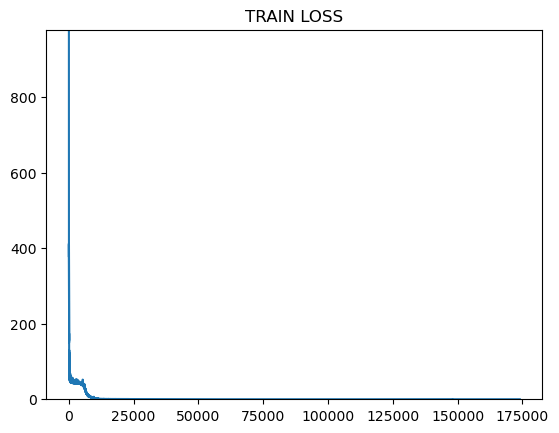

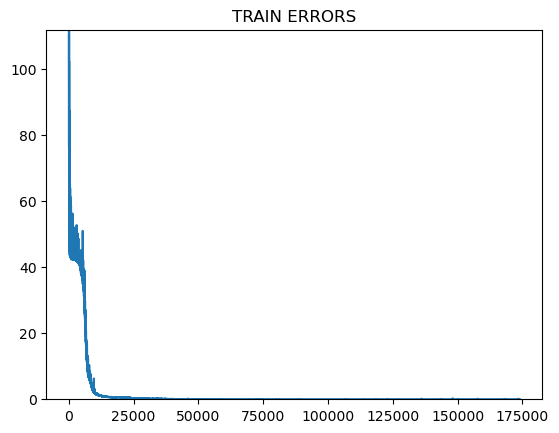

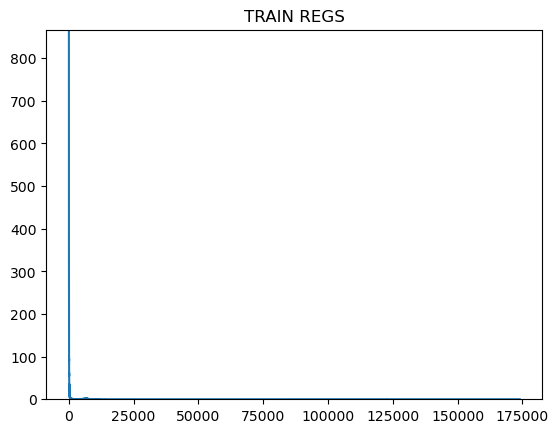

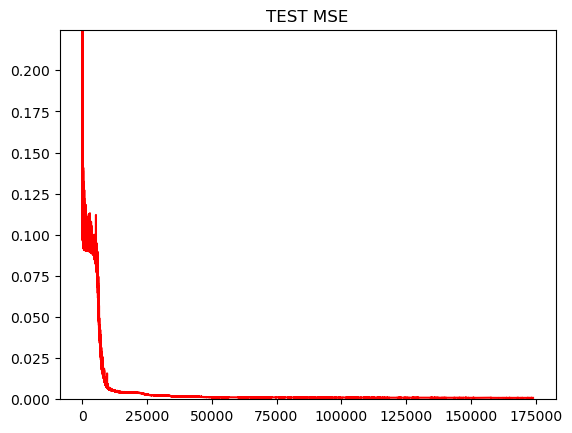

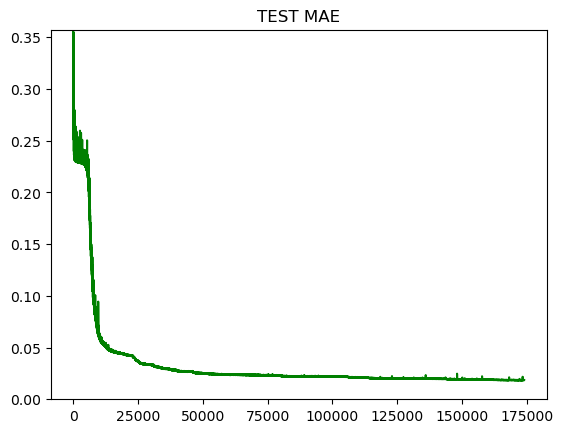

In [24]:
max_idx = 0

plt.figure()
plt.plot(train_losses)
plt.title("TRAIN LOSS")
plt.ylim(0., train_losses[max_idx])
plt.show()

plt.figure()
plt.plot(train_errors)
plt.title("TRAIN ERRORS")
plt.ylim(0., train_errors[max_idx])
plt.show()

if REG_HYPERPARAM > 0:
    plt.figure()
    plt.plot(train_regs)
    plt.title("TRAIN REGS")
    plt.ylim(0., train_regs[max_idx])
    plt.show()

plt.figure()
plt.plot(test_mses, color='r')
plt.title("TEST MSE")
plt.ylim(0., test_mses[max_idx])
plt.show()

plt.figure()
plt.plot(test_maes, color='g')
plt.title("TEST MAE")
plt.ylim(0, test_maes[max_idx])
plt.show()

In [25]:
print("Final Test MSE: ", test_mses[-1])
print("Best Test MSE: ", np.min(test_mses))
print("Best Test MSE Iteration: ", np.argmin(test_mses))

Final Test MSE:  0.0008473716443404555
Best Test MSE:  0.0008381280349567533
Best Test MSE Iteration:  167172


In [26]:
LENGTH = len(gt_freqs)

cn = str(CHIP_NUM) if CHIP_NUM > 9 else "0" + str(CHIP_NUM)
fname = os.path.join(ROOT_PATH, "case"+cn)

children = os.listdir(fname)
children = [f for f in children if cn + ".s" in f]

final_path = os.path.join(fname, children[0])

print(final_path)

fitter = VF.vectorfit.VectorFitter(final_path)
print(y_freqs)
fit1 = fitter.vector_fit("VF Result", y_freqs) 
vf_output = fit1.fitted_network.s
print(vf_output.shape)
print(vf_output.dtype)
vf_data = np.stack((vf_output.real, vf_output.imag), axis=-1)
vf_data = utils.matrix_to_sparams(vf_data)
vf_data = torch.tensor(vf_data).view(1, -1, LENGTH)
vf_data = vf_data.to(device)
print(vf_data.shape)

/scratch/cluster/bodeng/UTAFSDataNew/new_data/case23/case23.s2p
[4.0000e+07 7.3300e+08 1.0300e+09 1.3765e+09 2.1190e+09 2.2180e+09
 2.4655e+09 2.5645e+09 2.6140e+09 2.6635e+09 2.7130e+09 3.4555e+09
 3.5545e+09 4.0180e+09 4.2340e+09 4.5040e+09 4.7380e+09 4.8280e+09
 4.9900e+09 5.1160e+09 5.2600e+09 5.4760e+09 5.9440e+09 5.9620e+09
 6.4480e+09 6.9340e+09 7.0960e+09 7.4200e+09 7.9060e+09 8.3920e+09
 8.6620e+09 8.8780e+09 9.3640e+09 9.4900e+09 9.8500e+09 1.0030e+10
 1.0336e+10 1.0822e+10 1.1308e+10 1.1560e+10 1.1794e+10 1.2280e+10
 1.2766e+10 1.3252e+10 1.3738e+10 1.3792e+10 1.4224e+10 1.4476e+10
 1.4710e+10 1.5196e+10 1.5214e+10 1.5286e+10 1.5340e+10 1.5394e+10
 1.5682e+10 1.5808e+10 1.6168e+10 1.6654e+10 1.6888e+10 1.6978e+10
 1.7140e+10 1.7626e+10 1.8112e+10 1.8598e+10 1.9084e+10 1.9570e+10
 2.0056e+10 2.0272e+10 2.0542e+10 2.0884e+10 2.0920e+10 2.1028e+10
 2.1514e+10 2.2000e+10 2.2486e+10 2.2720e+10 2.2972e+10 2.3458e+10
 2.3746e+10 2.3944e+10 2.4286e+10 2.4430e+10 2.4916e+10 2.5132e+1

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 156489668004.12296). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.19352285377681255 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.6677321532339655 vs 1.7516416689185577)
Performing fit with 5 poles.
  Fitting took 0.5823411606252193 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.2642521582761252 vs 1.6677321532339655)
Performing fit with 6 poles.
  Fitting took 0.5244667809456587 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.3734180078409088 vs 1.2642521582761252)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 165153672685.43484). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.34646807983517647 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.5178572693882326 vs 1.2642521582761252)
Performing fit with 8 poles.
  Fitting took 0.2862472478300333 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.7518070487593873 vs 1.2642521582761252)
Performing fit with 9 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 13389931400.263779). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2700069844722748 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.5595120591056564 vs 0.7518070487593873)
Performing fit with 10 poles.
  Fitting took 0.17338570579886436 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9880570800721205 vs 0.7518070487593873)
Performing fit with 11 poles.
  Fitting took 0.1288104448467493 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.0009937101681214 vs 0.7518070487593873)
Fit completed in 3.269644021987915, using 11, resulting in a fit with 9 and error=0.7518070487593873 vs samples and error=0.7518070487593873 vs ground truth.
(2081, 2, 2)
complex128
torch.Size([1, 6, 2081])


In [27]:
## Make neworks from DIP, Interp, and Observations
DIP_OUT_MATRIX = utils.sparams_to_matrix(out)
VF_MATRIX = utils.sparams_to_matrix(vf_data)
Y_MATRIX = utils.sparams_to_matrix(y)

print(DIP_OUT_MATRIX.shape)
print(VF_MATRIX.shape)
print(Y_MATRIX.shape)

DIP_net = utils.matrix_to_network(DIP_OUT_MATRIX, gt_freqs, "DIP Recon With "+str(M)+" Samples for Chip "+str(CHIP_NUM))
VF_net = utils.matrix_to_network(VF_MATRIX, gt_freqs, "Vector Fit With "+str(M)+" Samples for Chip "+str(CHIP_NUM))
Y_net = utils.matrix_to_network(Y_MATRIX, y_freqs, "Observations for Chip "+str(CHIP_NUM))

DIP_FINAL_OUT = np.stack((DIP_net.s.real, DIP_net.s.imag), axis=-1)
VF_FINAL_OUT = np.stack((VF_net.s.real, VF_net.s.imag), axis=-1)

print(DIP_FINAL_OUT.shape)
print(VF_FINAL_OUT.shape)

dip_data = utils.matrix_to_sparams(DIP_FINAL_OUT)
vf_data_mat = utils.matrix_to_sparams(VF_FINAL_OUT)

print(dip_data.shape)
print(vf_data_mat.shape)
print(dip_data.dtype)
print(vf_data_mat.dtype)

## Compare DIP, VF, and Interp
import skimage.metrics
from skimage.metrics import peak_signal_noise_ratio as psnr

psnr_ours = psnr(gt_data, dip_data)
psnr_vf = psnr(gt_data, vf_data_mat)
print("DIP PSNR:      ", psnr_ours)
print("VF PSNR:       ", psnr_vf)

print("Final DIP MSE: ", test_mses[-1])
print("VF MSE:        ", nn.MSELoss()(vf_data, x).item())
print("Mean DIP MSE: ", nn.MSELoss()(sgld_means_by_sample[-1][np.newaxis], x).item())

torch.Size([2081, 2, 2, 2])
torch.Size([2081, 2, 2, 2])
torch.Size([155, 2, 2, 2])
(2081, 2, 2, 2)
(2081, 2, 2, 2)
(3, 2, 2081)
(3, 2, 2081)
float32
float32
DIP PSNR:       36.73986056918238
VF PSNR:        18.673682433831623
Final DIP MSE:  0.0008473716443404555
VF MSE:         0.05428648740053177
Mean DIP MSE:  0.0008509642211720347


(2081,)
torch.Size([6, 2081])
torch.Size([1, 6, 2081])
torch.Size([1, 6, 155])
torch.Size([1, 6, 2081])
torch.Size([1, 6, 2081])


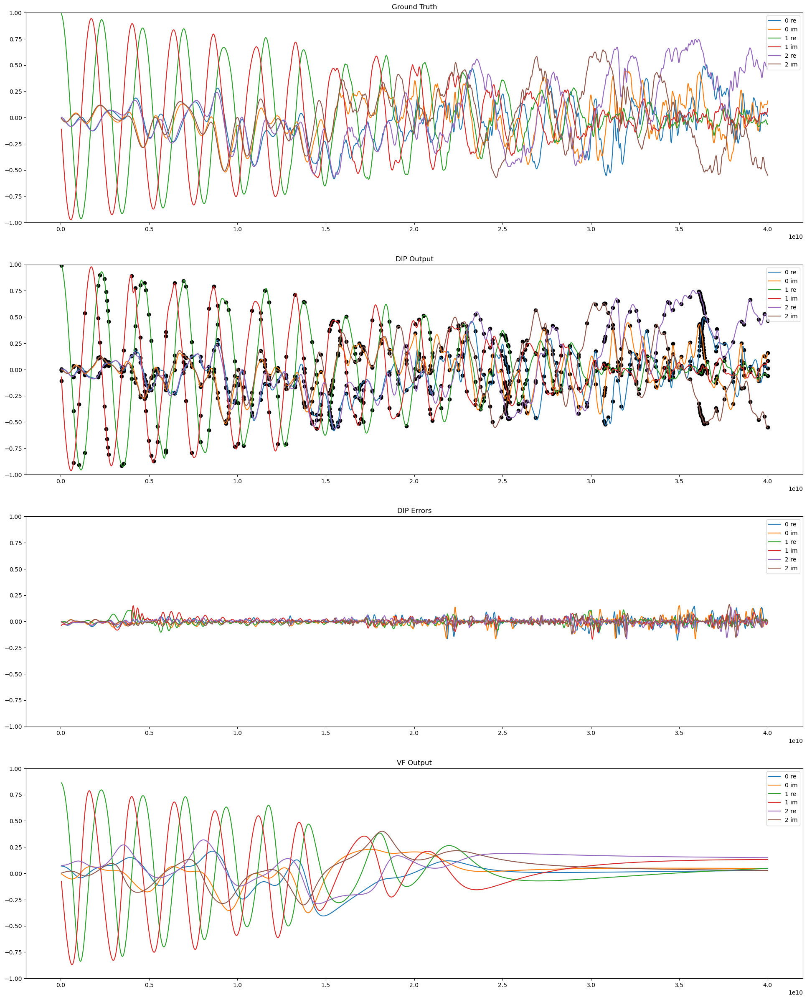

In [28]:
dip_errors = x.detach().cpu() - sgld_means_by_sample[-1].detach().cpu()
print(gt_freqs.shape)
print(sgld_means_by_sample[-1].shape)
print(dip_errors.shape)
print(y.shape)

print(out.shape)
print(vf_data.shape)

fig, axes = plt.subplots(4,1, figsize=(24, 30))
axes = axes.flatten()

for i in range(N_SPARAMS):
    axes[0].plot(gt_freqs, x[0,2*i].cpu(), label=str(i)+" re")
    axes[0].plot(gt_freqs, x[0,2*i+1].cpu(), label=str(i)+" im")
axes[0].set_title("Ground Truth")
axes[0].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[0].legend(loc='upper right')

# SHOW WITH MEAN AND STD DEVS
# for i in range(N_SPARAMS):

#     axes[1].plot(gt_freqs, sgld_means_by_sample[-1][2*i].detach().cpu(), label=str(i)+" re")
#     axes[1].plot(gt_freqs, sgld_means_by_sample[-1][2*i+1].detach().cpu(), label=str(i)+" im")
#     axes[1].fill_between(gt_freqs, sgld_means_by_sample[-1][2*i].detach().cpu() - 2 * sgld_stds_by_sample[-1][2*i].detach().cpu(), sgld_means_by_sample[-1][2*i].detach().cpu() + 2 * sgld_stds_by_sample[-1][2*i].detach().cpu())
#     axes[1].fill_between(gt_freqs, sgld_means_by_sample[-1][2*i+1].detach().cpu() - 2 * sgld_stds_by_sample[-1][2*i+1].detach().cpu(), sgld_means_by_sample[-1][2*i+1].detach().cpu() + 2 * sgld_stds_by_sample[-1][2*i+1].detach().cpu())

#     # axes[1].scatter(gt_freqs[kept_inds], y[0,2*i].cpu(), color='black')
#     # axes[1].scatter(gt_freqs[kept_inds], y[0,2*i+1].cpu(), color='black')


# axes[1].set_title("DIP Output")
# axes[1].set_ylim(-1,1)
# if N_SPARAMS <= 10:
#     axes[1].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[1].plot(gt_freqs, out[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[1].plot(gt_freqs, out[0,2*i+1].detach().cpu(), label=str(i)+" im")

    axes[1].scatter(gt_freqs[kept_inds], y[0,2*i].cpu(), color='black')
    axes[1].scatter(gt_freqs[kept_inds], y[0,2*i+1].cpu(), color='black')
axes[1].set_title("DIP Output")
axes[1].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[1].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[2].plot(gt_freqs, dip_errors[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[2].plot(gt_freqs, dip_errors[0,2*i+1].detach().cpu(), label=str(i)+" im")
axes[2].set_title("DIP Errors")
axes[2].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[2].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[3].plot(gt_freqs, vf_data[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[3].plot(gt_freqs, vf_data[0,2*i+1].detach().cpu(), label=str(i)+" im")
axes[3].set_title("VF Output")
axes[3].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[3].legend(loc='upper right')

In [29]:
torch.set_printoptions(threshold=100000)
print(sgld_stds_by_sample[-1])

tensor([[1.3866e-03, 1.3948e-03, 1.4126e-03, 1.3921e-03, 1.3345e-03, 1.2904e-03,
         1.2579e-03, 1.1697e-03, 1.0288e-03, 8.4695e-04, 6.2909e-04, 3.7330e-04,
         3.0136e-04, 4.3251e-04, 6.7253e-04, 8.6039e-04, 9.8953e-04, 1.1424e-03,
         1.3172e-03, 1.4291e-03, 1.4774e-03, 1.5027e-03, 1.5066e-03, 1.4915e-03,
         1.4545e-03, 1.4038e-03, 1.3444e-03, 1.5118e-03, 1.3911e-03, 1.2070e-03,
         1.0325e-03, 7.3329e-04, 3.7194e-04, 3.7631e-04, 2.5357e-04, 2.3797e-04,
         1.4291e-04, 2.4798e-04, 4.2049e-04, 6.3110e-04, 8.8992e-04, 1.1470e-03,
         1.3551e-03, 1.4505e-03, 1.3647e-03, 1.3323e-03, 1.3271e-03, 1.3754e-03,
         1.2746e-03, 1.1572e-03, 1.0282e-03, 9.3871e-04, 9.5518e-04, 8.7287e-04,
         7.7083e-04, 6.1322e-04, 4.1284e-04, 2.8976e-04, 3.5836e-04, 2.4155e-04,
         2.4492e-04, 3.0782e-04, 3.5272e-04, 4.2347e-04, 5.1726e-04, 1.6852e-03,
         1.8286e-03, 1.9170e-03, 1.9466e-03, 1.9493e-03, 1.9265e-03, 1.8647e-03,
         1.7663e-03, 1.5502e

In [30]:
print(dip_errors[-1])

tensor([[-3.0486e-03, -6.0608e-03, -1.1872e-02, -1.8719e-02, -2.5846e-02,
         -3.1802e-02, -3.5701e-02, -3.7477e-02, -3.6333e-02, -3.3186e-02,
         -2.7540e-02, -2.0551e-02, -1.4481e-02, -9.9070e-03, -8.4356e-03,
         -8.8393e-03, -1.1819e-02, -1.2674e-02, -1.2272e-02, -1.0890e-02,
         -9.3287e-03, -9.2513e-03, -1.1170e-02, -1.2582e-02, -1.3572e-02,
         -1.2671e-02, -9.5172e-03, -6.2772e-03, -6.2556e-03, -1.0004e-02,
         -1.6617e-02, -2.4899e-02, -3.4056e-02, -4.2104e-02, -4.7382e-02,
         -4.9325e-02, -4.8169e-02, -4.2978e-02, -3.5828e-02, -2.7478e-02,
         -1.8323e-02, -1.1481e-02, -7.7606e-03, -6.8759e-03, -8.0381e-03,
         -9.5750e-03, -1.2202e-02, -1.3028e-02, -1.2073e-02, -1.0467e-02,
         -8.3788e-03, -7.3145e-03, -4.3430e-03,  2.6809e-03,  7.4333e-03,
          1.0069e-02,  1.0685e-02,  7.3663e-03, -7.7592e-04, -1.1968e-02,
         -2.3573e-02, -3.4354e-02, -4.4138e-02, -5.1432e-02, -5.5964e-02,
         -5.3860e-02, -4.6857e-02, -3.

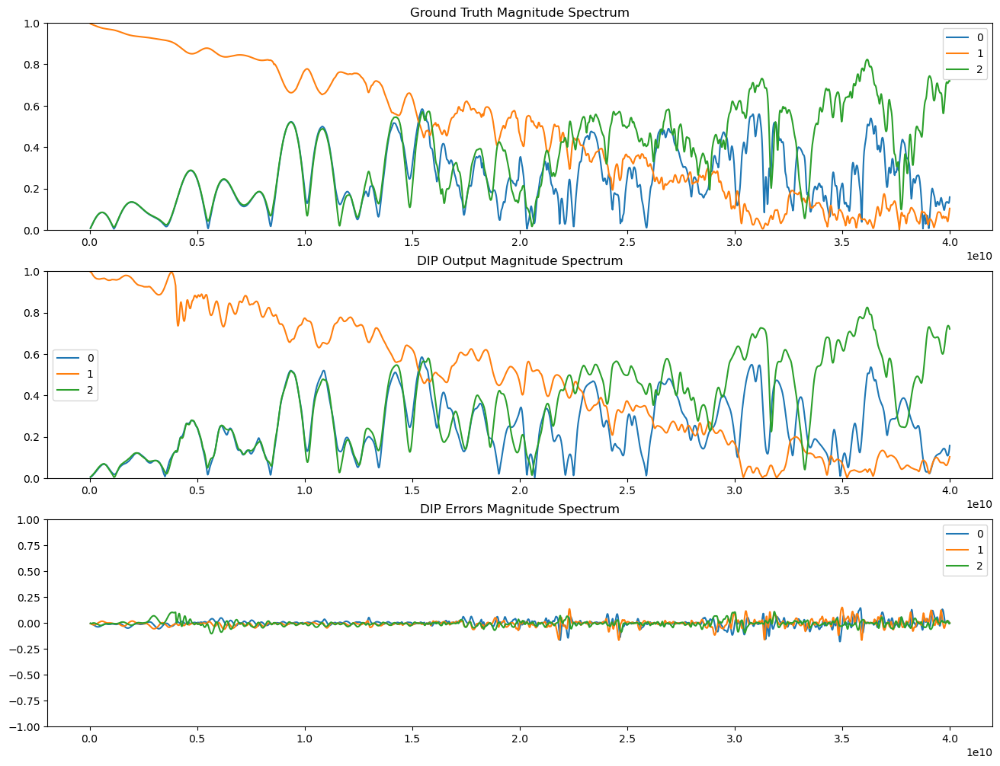

In [31]:
out_mag = utils.sparams_to_mag(out)
dip_errors_mag = x_mag - out_mag 

fig, axes = plt.subplots(3,1, figsize=(16, 12))
axes = axes.flatten()

for i in range(N_SPARAMS):
    axes[0].plot(gt_freqs, x_mag[0,i].cpu(), label=str(i))
axes[0].set_title("Ground Truth Magnitude Spectrum")
axes[0].set_ylim(0,1)
if N_SPARAMS <= 10:
    axes[0].legend()

for i in range(N_SPARAMS):
    axes[1].plot(gt_freqs, out_mag[0,i].detach().cpu(), label=str(i))
axes[1].set_title("DIP Output Magnitude Spectrum")
axes[1].set_ylim(0,1)
if N_SPARAMS <= 10:
    axes[1].legend()
    
for i in range(N_SPARAMS):
    axes[2].plot(gt_freqs, dip_errors[0,i].detach().cpu(), label=str(i))
axes[2].set_title("DIP Errors Magnitude Spectrum")
axes[2].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[2].legend()

In [32]:
print(kept_inds)

[   0   14   20   27   42   44   49   51   52   53   54   69   71   81
   93  108  121  126  135  142  150  162  188  189  216  243  252  270
  297  324  339  351  378  385  405  415  432  459  486  500  513  540
  567  594  621  624  648  662  675  702  703  707  710  713  729  736
  756  783  796  801  810  837  864  891  918  945  972  984  999 1018
 1020 1026 1053 1080 1107 1120 1134 1161 1177 1188 1207 1215 1242 1254
 1255 1256 1257 1258 1263 1264 1265 1269 1296 1310 1318 1323 1350 1377
 1386 1404 1416 1431 1458 1485 1512 1539 1566 1567 1568 1569 1579 1593
 1609 1620 1647 1667 1674 1701 1728 1755 1766 1772 1782 1809 1836 1863
 1865 1866 1867 1868 1869 1870 1871 1872 1873 1874 1875 1876 1877 1878
 1879 1880 1881 1882 1890 1917 1920 1944 1971 1998 2005 2025 2052 2070
 2080]
